### Laboratorium 4 - zadania

In [2]:
import os

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries, slic

#### Zadanie 1

Dane są obrazy `tabby` i `pills`. Wykonaj dla nich segmentację przy użyciu algorytmu SLIC. Celem jest uzyskanie **jednolitych**  superpikseli, a więc zawierających tylko fragmenty obiektów lub tylko tła (a nie jednego i drugiego naraz). Przeanalizuj zachowanie algorytmu dla różnej liczby superpikseli i parametru sigma.

Zwróć uwagę, że wynikiem działania scikitowej implementacji SLIC - [`skimage.segmentation.slic`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.slic) - (podobnie jak wielu innych algorytmów klasyfikacyjnych) jest obraz typu `np.int64` przyporządkowujący każdemu pikselowi obrazu wejściowego indeks superpiksela. Takiej reprezentacji oczekuje też funkcja [`mark_boundaries`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.mark_boundaries).

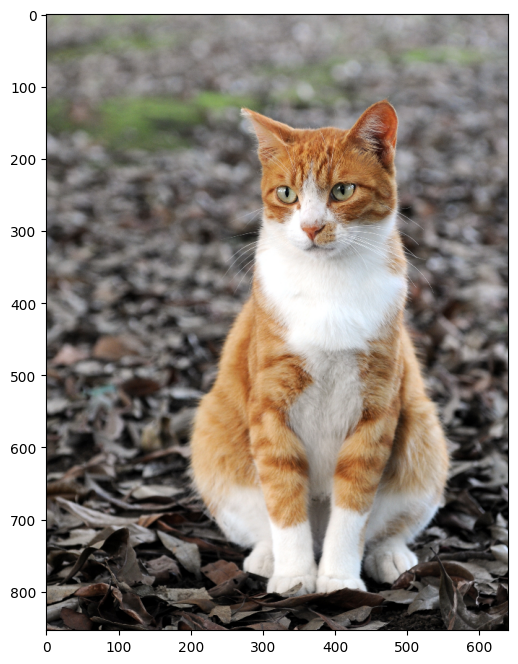

In [3]:
_ = cv2.imread('tabby.jpg')[..., ::-1]
tabby = cv2.resize(_, dsize=None, fx=0.3, fy=0.3)
plt.subplots(1,1,figsize=(8,8))[1].imshow(tabby);

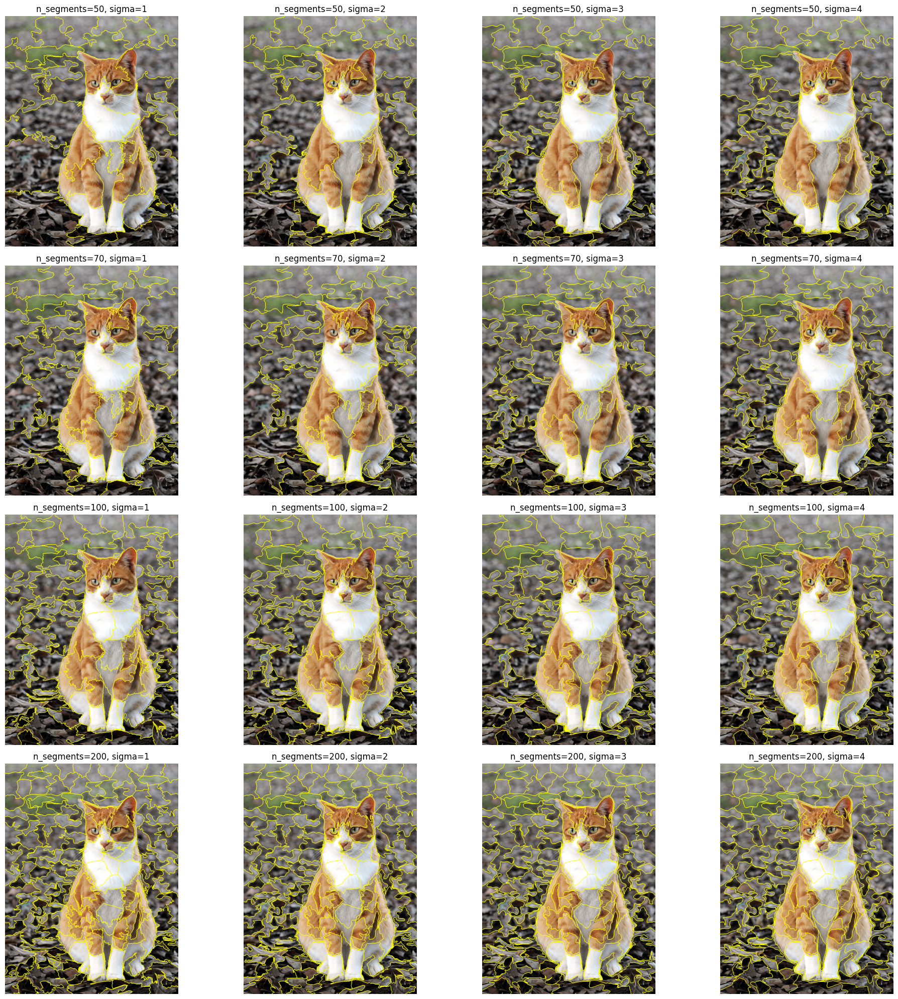

In [4]:
n_segments_list = [50, 70, 100, 200]
sigma_list = [1, 2, 3, 4]

fig, axes = plt.subplots(len(n_segments_list), len(sigma_list), figsize=(20, 20))

for i, n_segments in enumerate(n_segments_list):
    for j, sigma in enumerate(sigma_list):
        segments = slic(tabby, n_segments=n_segments, sigma=sigma)
        axes[i, j].imshow(mark_boundaries(tabby, segments))
        axes[i, j].set_title(f'n_segments={n_segments}, sigma={sigma}')
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()


#### Wpływ parametrów `n_segments` oraz `sigma` na algorytm SLIC


- **`n_segments`**: Określa liczbę superpikseli, na które zostanie podzielony obraz. Wartość tego parametru bezpośrednio wpływa na rozmiar i liczbę superpikseli:
    - **Mała liczba segmentów (`n_segments`)**: Prowadzi do większych superpikseli, które mogą obejmować większe obszary obrazu. Może to skutkować mniejszą dokładnością segmentacji, ponieważ superpiksele mogą zawierać zarówno fragmenty obiektów, jak i tła.
    - **Duża liczba segmentów (`n_segments`)**: Prowadzi do mniejszych superpikseli, co pozwala na bardziej szczegółową segmentację. Może to jednak zwiększyć złożoność obliczeniową i czas przetwarzania.

- **`sigma`**: Parametr ten kontroluje stopień wygładzania obrazu przed segmentacją. Wartość `sigma` wpływa na to, jak bardzo algorytm uwzględnia różnice w kolorach i teksturach:
    - **Mała wartość sigma**: Minimalne wygładzanie, co oznacza, że algorytm będzie bardziej czuły na drobne szczegóły i szumy w obrazie. Może to prowadzić do bardziej nieregularnych superpikseli.
    - **Duża wartość sigma**: Większe wygładzanie, co sprawia, że algorytm staje się mniej czuły na drobne szczegóły i szumy. Superpiksele będą bardziej jednolite i regularne, ale może to również prowadzić do utraty niektórych szczegółów obrazu.


Za mała liczba superpixeli - pixele obiektu i tła należą do jednego wspólnego superpixela.

Text(0.5, 1.0, 'Masked image')

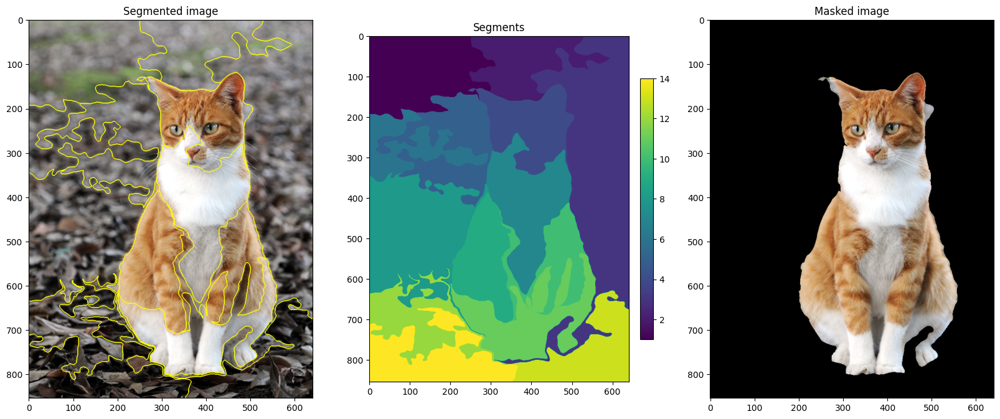

In [139]:
sigma = 4
segments = 21

fig, axs = plt.subplots(1, 3, figsize=(20, 20))

tabby_slic = slic(tabby, n_segments=segments, compactness=10, sigma=sigma)

segments_with_tabby = [4,7,9,10,11]

maaksed_image = np.zeros_like(tabby)
for segment in segments_with_tabby:
    maaksed_image[tabby_slic == segment] = tabby[tabby_slic == segment]

# Display the segmented image with boundaries
im0 = axs[0].imshow(mark_boundaries(tabby, tabby_slic))
axs[0].set_title("Segmented image")

# Show number of segments
im1 = axs[1].imshow(tabby_slic)
axs[1].set_title("Segments")
fig.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04)

# Display the masked image
im2 = axs[2].imshow(maaksed_image)
axs[2].set_title("Masked image")

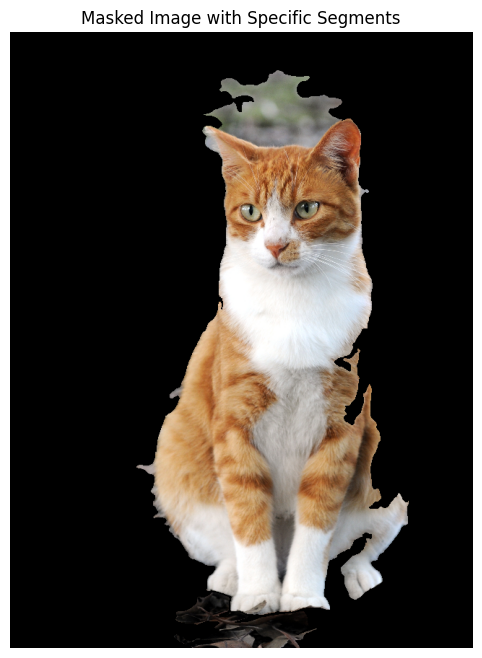

In [5]:
# Define the segments you want to show

segments = slic(tabby, n_segments=50, sigma=2)
desired_segments = [7, 12,16, 17, 21, 22, 25, 27, 28, 31, 34]  # Replace with the segments you want to show

# Create a mask for the desired segments
segmentation_mask = np.isin(segments, desired_segments)

# Apply the mask to the image
masked_image = tabby.copy()
masked_image[~segmentation_mask] = 0

# Display the masked image
plt.figure(figsize=(8, 8))
plt.imshow(masked_image)
plt.title('Masked Image with Specific Segments')
plt.axis('off')
plt.show()


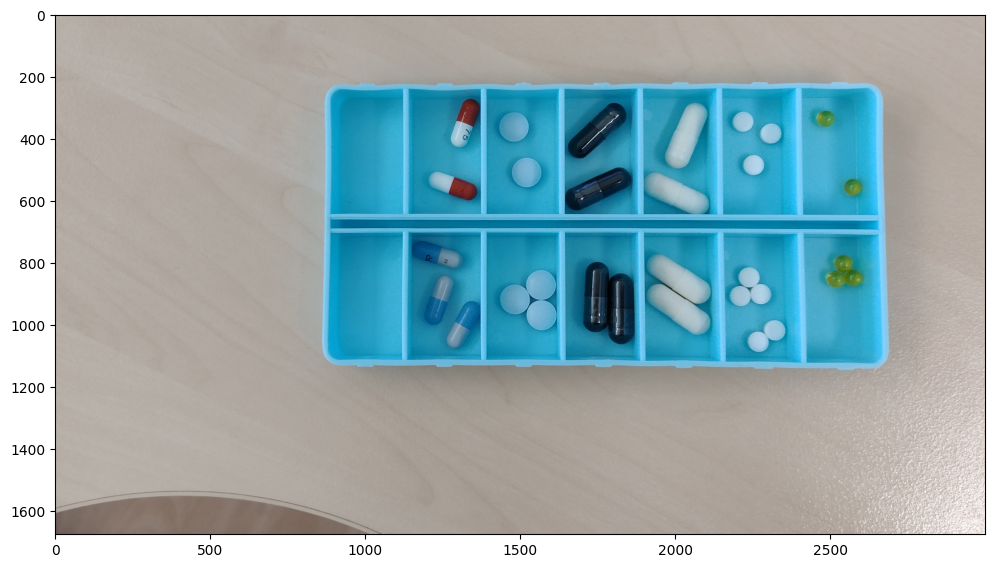

In [6]:
pills = cv2.imread('pills.png')[..., ::-1]
plt.subplots(1,1,figsize=(12,8))[1].imshow(pills);

Analiza

In [ ]:
n_segments_list = [200, 400, 800]
sigma_list = [2, 4, 8]

fig, axes = plt.subplots(len(n_segments_list), len(sigma_list), figsize=(20, 14))

for i, n_segments in enumerate(n_segments_list):
    for j, sigma in enumerate(sigma_list):
        segments = slic(pills, n_segments=n_segments, sigma=sigma)
        boundaries = mark_boundaries(pills, segments)
        axes[i, j].imshow(boundaries)
        axes[i, j].set_title(f"n_segments={n_segments}, sigma={sigma}")

plt.tight_layout()
plt.show()

Analiza z przybliżeniem:

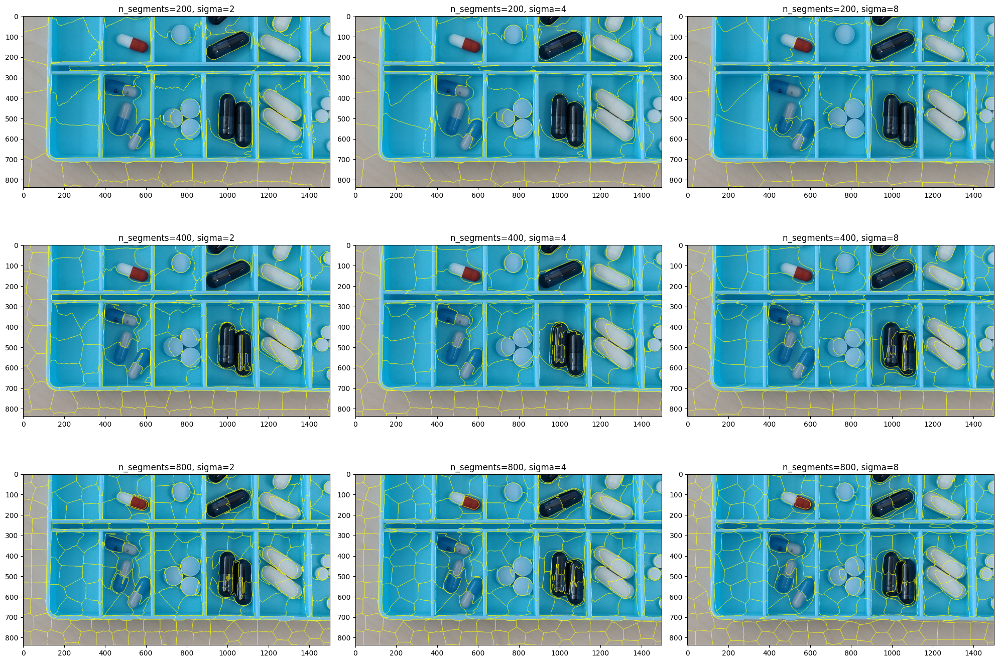

In [10]:
n_segments_list = [200, 400, 800]
sigma_list = [2, 4, 8]

fig, axes = plt.subplots(len(n_segments_list), len(sigma_list), figsize=(20, 14))

for i, n_segments in enumerate(n_segments_list):
    for j, sigma in enumerate(sigma_list):
        segments = slic(pills, n_segments=n_segments, sigma=sigma)
        boundaries = mark_boundaries(pills, segments)
        # crop the image to 50% of center
        height, width, _ = boundaries.shape
        crop_x1, crop_x2 = width // 4, 3 * width // 4
        crop_y1, crop_y2 = height // 4, 3 * height // 4
        cropped_boundaries = boundaries[crop_y1:crop_y2, crop_x1:crop_x2]
        axes[i, j].imshow(cropped_boundaries)
        axes[i, j].set_title(f"n_segments={n_segments}, sigma={sigma}")

plt.tight_layout()
plt.show()


#### Zadanie 2

Dla obrazu `tabby` wykonaj post-processing segmentacji SLIC by uzyskać dwa jednorodne obszary: jeden zawierający wyłącznie kota, drugi zawierający wyłącznie tło.

Można to zadanie potraktować jako binaryzację na poziomie superpikseli i zrealizować je za pomocą progowania. 
Można też potraktować je jako klasteryzację superpikseli i wykorzystać np. [`cv2.kmeans`](https://docs.opencv.org/4.x/d5/d38/group__core__cluster.html#ga9a34dc06c6ec9460e90860f15bcd2f88).  
Niezależnie od wybranej ścieżki, konieczne będzie opisanie każdego z superpikseli za pomocą jakiejś *cechy* go opisującej (lub kilku cech). Najprostszymi cechami mogą być np. średnie wartości składowych barwy pikseli wchodzących w skład superpiksela.  
Do zastanowienia: jakie parametry SLICa wybrać jako podstawę w tym zadaniu?

Zaprezentuj wyniki albo za pomocą `mark_boundaries` albo wyświetlając maskę binarną.

---

NumPy pro-tip: aby uzyskać zbiór wszystkich pikseli obrazu o wartości np. 3 możesz użyć notacji: ```obraz==3```. Wynikiem jest macierz boolowska, której można używać jako selektor. Np. aby na obrazie `A` wyzerować wszystkie piksele, którym w obrazie `B` odpowiada wartość 5, możesz napisać:  
```A[B==5] = 0```  
Ten zapis jest **znacznie** szybszy niż manualne iterowanie po obrazach i sprawdzanie warunków if-ami.

---

Przykładowe użycie `cv2.kmeans` (więcej możesz poczytać np. [tutaj](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_ml/py_kmeans/py_kmeans_opencv/py_kmeans_opencv.html)):
```python
c, labels, centers = cv2.kmeans(
    data=data,  # np.ndarray typu float o wymiarach NxK gdzie N to liczba sampli (u nas: superpikseli), K - liczba cech
    K=2,        # oczekiwana liczba klastrów
    bestLabels=None,
    criteria=(cv2.TERM_CRITERIA_EPS, 10, 1.0),  # przykładowe kryteria stopu
    attempts=1, # liczba powtórzeń algorytmu
    flags=cv2.KMEANS_RANDOM_CENTERS  # sposób inicjalizacji klastrów
)
```

Funkcja ta zwraca krotkę, której najważniejszym komponentem jest ten drugi (tu: `labels`), tj. macierz o wymiarach Nx1, zawierająca indeks klastra przypisanego i-temu samplowi.

In [104]:
from mpl_toolkits.mplot3d import Axes3D

def display_image_in_3d_rgb(image):
    """
    Display an image in a 3D RGB color model.
    
    Parameters:
    image (numpy.ndarray): The input image in RGB format.
    """
    # Flatten the image array and normalize the RGB values to [0, 1]
    pixels = image.reshape(-1, 3) / 255.0
    
    # Create a 3D plot
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot the RGB values
    ax.scatter(pixels[:, 0], pixels[:, 1], pixels[:, 2], c=pixels, marker='o')
    
    # Set labels and title
    ax.set_xlabel('Red')
    ax.set_ylabel('Green')
    ax.set_zlabel('Blue')
    ax.set_title('3D RGB Color Model')
    
    plt.show()


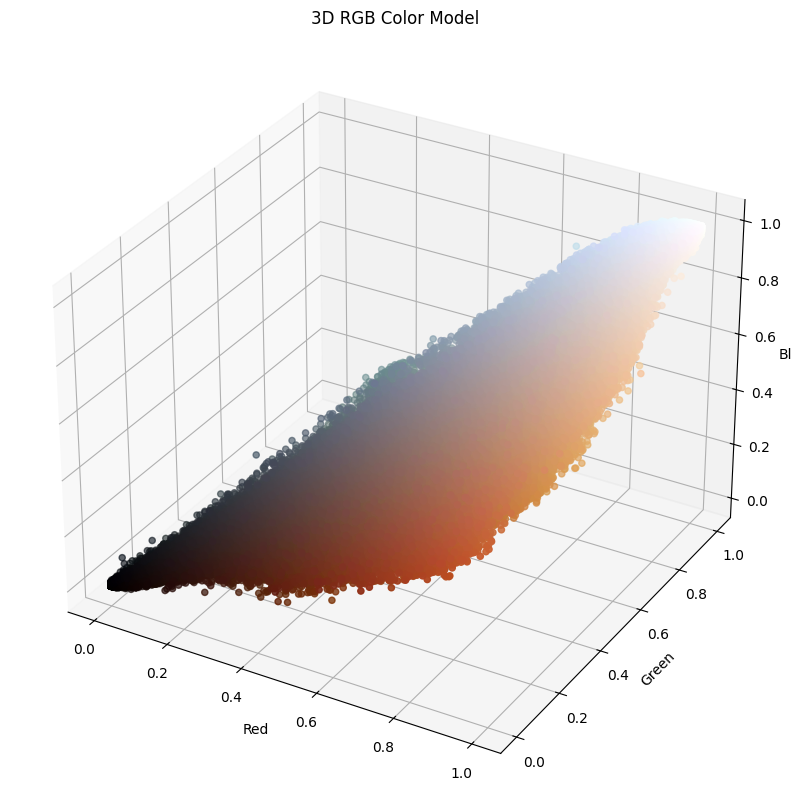

In [105]:
_ = cv2.imread("tabby.jpg")[..., ::-1]
tabby_rgb = cv2.resize(_, dsize=None, fx=0.3, fy=0.3)

# Example usage
display_image_in_3d_rgb(tabby_rgb)

In [5]:
# zacznij od przygotowania macierzy wejściowej (data) reprezentującej superpiksele jako punkty danych

[[  1   1   1 ...  12  12  12]
 [  1   1   1 ...  12  12  12]
 [  1   1   1 ...  12  12  12]
 ...
 [186 186 186 ... 184 184 184]
 [186 186 186 ... 184 184 184]
 [186 186 186 ... 184 184 184]]


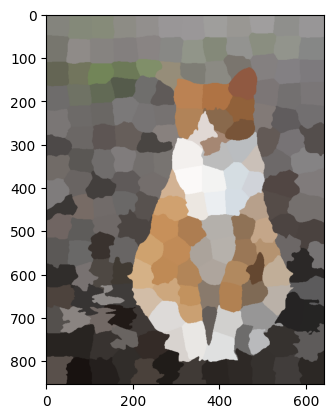

In [106]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from skimage.color import label2rgb

def calculate_superpixel_attributes(image, segments):

    # change color model to hsv
    # hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    attributes = {}
    for segment_value in np.unique(segments):
        mask = segments == segment_value
        superpixel = image[mask]

        # Calculate attributes
        min_color = np.min(superpixel, axis=0)
        mean_color = np.mean(superpixel, axis=0)
        max_color = np.max(superpixel, axis=0)
        median_color = np.median(superpixel, axis=0)

        attributes[segment_value] = {
            "min_color": min_color,
            "mean_color": mean_color,
            "max_color": max_color,
            "median_color": median_color,
        }

    return attributes



# Apply SLIC to segment the image into superpixels
segments = slic(tabby_rgb, n_segments=200, sigma=2, compactness=40)
print(segments)
plt.imshow(label2rgb(segments, tabby_rgb, kind='avg'))

# Calculate attributes for each superpixel
attributes = calculate_superpixel_attributes(tabby_rgb, segments)



In [307]:
import pandas as pd
import numpy as np

# Assuming attributes is already calculated as in your provided code
# Create a DataFrame from the attributes
data_dict = {
    "mean_color": [
        attributes[segment]["mean_color"] for segment in np.unique(segments)
    ],
    "min_color": [attributes[segment]["min_color"] for segment in np.unique(segments)],
    "max_color": [attributes[segment]["max_color"] for segment in np.unique(segments)],
    "median_color": [
        attributes[segment]["median_color"] for segment in np.unique(segments)
    ],
}

# Convert lists of color attributes to separate columns for each color channel
df = pd.DataFrame(data_dict)
df[["mean_color_r", "mean_color_g", "mean_color_b"]] = pd.DataFrame(
    df["mean_color"].tolist(), index=df.index
)
df[["min_color_r", "min_color_g", "min_color_b"]] = pd.DataFrame(
    df["min_color"].tolist(), index=df.index
)
df[["max_color_r", "max_color_g", "max_color_b"]] = pd.DataFrame(
    df["max_color"].tolist(), index=df.index
)
df[["median_color_r", "median_color_g", "median_color_b"]] = pd.DataFrame(
    df["median_color"].tolist(), index=df.index
)

# Drop the original combined color columns
df = df.drop(columns=[
    "mean_color",
    "min_color", 
    "max_color", 
    "median_color"
    ])
print(df.describe())
# transform to float

df = df.astype(np.float32)

from sklearn.preprocessing import MinMaxScaler
scaler =  MinMaxScaler()

data_normalized = scaler.fit_transform(df)

# data_normalized = df.to_numpy()

print(data_normalized.shape)

       mean_color_r  mean_color_g  mean_color_b  min_color_r  min_color_g  \
count    191.000000    191.000000    191.000000   191.000000   191.000000   
mean     128.049336    118.962752    109.545727    61.931937    54.942408   
std       51.531524     48.596774     48.622698    49.765879    46.345293   
min       24.179415     18.633617     16.045955     0.000000     0.000000   
25%       94.829868     90.389521     80.428683    16.500000    13.500000   
50%      122.387508    116.172591    105.517311    59.000000    50.000000   
75%      157.205456    143.261251    131.756567    98.000000    89.500000   
max      251.291730    249.709796    248.184010   217.000000   214.000000   

       min_color_b  max_color_r  max_color_g  max_color_b  median_color_r  \
count   191.000000   191.000000   191.000000   191.000000      191.000000   
mean     45.680628   191.240838   183.732984   180.916230      128.036649   
std      43.248457    34.188866    32.491568    34.158043       54.308269  

In [ ]:

# create data NxM where N is number of superpixels and M is number of features
data_min = np.array(
    [attributes[segment]["min_color"] for segment in np.unique(segments)],
    dtype=np.float32,
)

data_mean = np.array(
    [attributes[segment]["mean_color"] for segment in np.unique(segments)],
    dtype=np.float32,
)

data_median = np.array(
    [attributes[segment]["median_color"] for segment in np.unique(segments)],
    dtype=np.float32,
)

data_max = np.array(
    [attributes[segment]["max_color"] for segment in np.unique(segments)],
    dtype=np.float32,
)

data_area = np.array(
    [attributes[segment]["area"] for segment in np.unique(segments)],
    dtype=np.float32,
)

data_center_x = np.array(
    [attributes[segment]["center_x"] for segment in np.unique(segments)],
    dtype=np.float32,
)

data_center_y = np.array(
    [attributes[segment]["center_y"] for segment in np.unique(segments)],
    dtype=np.float32,
)

# Combine all features into a single data array
data = np.hstack((
    data_mean, 
    data_min, 
    data_max, 
    data_median, 
    data_center_x.reshape(-1, 1), 
    data_center_y.reshape(-1, 1)
))
# normalize data
# Normalize data
# data = (data - np.mean(data, axis=0)) / np.std(data, axis=0)

print(data.shape)
#

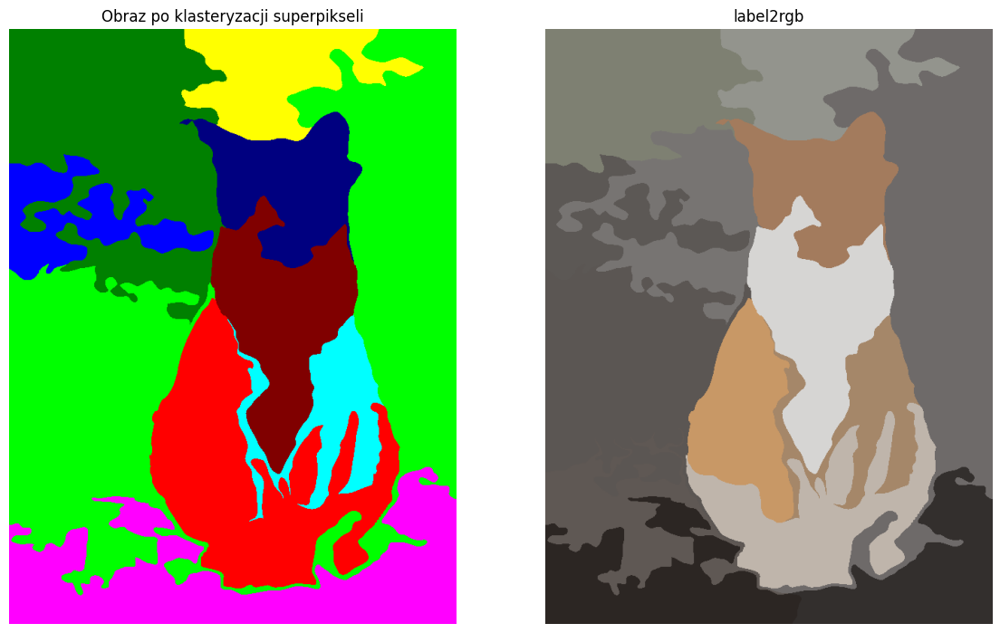

In [112]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 2)
k = 9  # Number of clusters
_, labels, centers = cv2.kmeans(
    data_normalized, k, None, criteria, 200, cv2.KMEANS_PP_CENTERS
)


# Create an empty image to store the color-coded segments
color_coded_image = np.zeros_like(tabby_rgb)

# Define colors for each cluster
cluster_colors = [
    (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), 
    (255, 0, 255), (0, 255, 255), (128, 0, 0), (0, 128, 0),
    (0, 0, 128), (128, 128, 0), (128, 0, 128), (0, 128, 128),
    (64, 0, 0), (0, 64, 0), (0, 0, 64), (64, 64, 0),
    (64, 0, 64), (0, 64, 64), (32, 0, 0), (0, 32, 0)
]  # Add more colors if you have more clusters

labels = labels.flatten()

# Sprawdzamy, czy liczba klastrów nie przekracza liczby dostępnych kolorów
if len(np.unique(labels)) > len(cluster_colors):
    raise ValueError(
        "Nie zdefiniowano wystarczającej liczby kolorów dla wszystkich klastrów!"
    )

# Przypisanie etykiet klastrów do segmentów superpikseli
clustered_image = np.zeros(tabby_rgb.shape, dtype=np.uint8)

# Iteracja po superpikselach i przypisanie koloru klastra do odpowiednich segmentów
for i, segVal in enumerate(np.unique(segments)):
    mask = segments == segVal
    clustered_image[mask] = cluster_colors[labels[i]]

# Wyświetlanie obrazu po klasteryzacji

fig, ax = plt.subplots(1, 2, figsize=(14, 10))

# Display the clustered image
ax[0].imshow(clustered_image)
ax[0].set_title("Obraz po klasteryzacji superpikseli")
ax[0].axis('off')

# Display the label2rgb image
ax[1].imshow(label2rgb(segments, tabby_rgb, kind='avg'))
ax[1].set_title("label2rgb")
ax[1].axis('off')

plt.show()

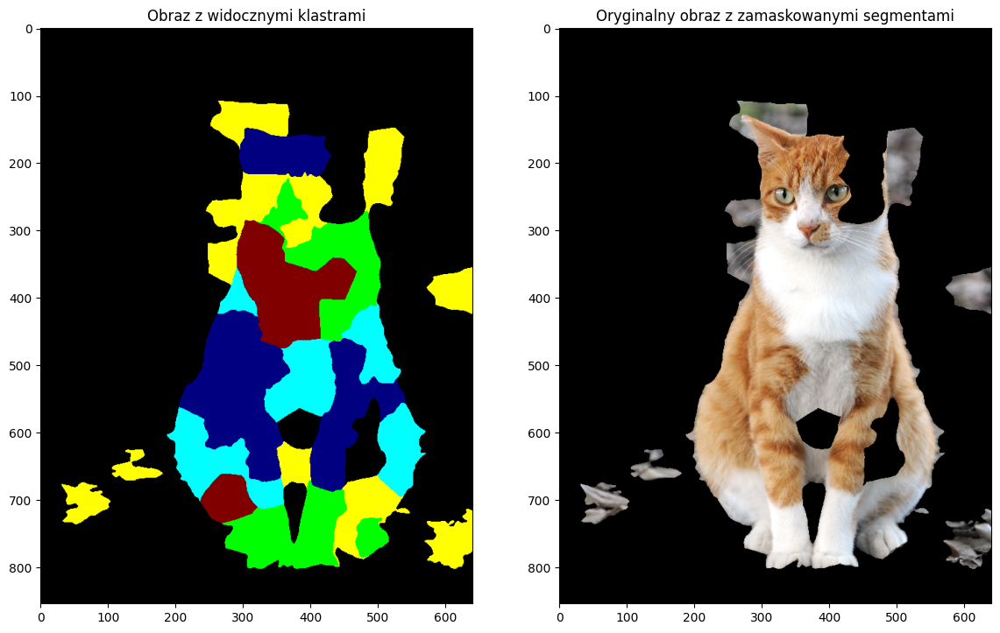

In [324]:
clusters_to_display = [1,3,5,6,8,9]

# Flattening the labels array
labels = labels.flatten()

if len(np.unique(labels)) > len(cluster_colors):
    raise ValueError(
        "Nie zdefiniowano wystarczającej liczby kolorów dla wszystkich klastrów!"
    )

# Tworzenie obrazu z widocznymi klastrami
clustered_image = np.zeros(tabby_rgb.shape, dtype=np.uint8)

# Tworzenie maski, która wyłączy segmenty, których nie chcemy pokazywać
mask = np.zeros(tabby_rgb.shape[:2], dtype=bool)

# Iteracja po superpikselach i kolorowanie tylko wybranych klastrów
for i, segVal in enumerate(np.unique(segments)):
    cluster_label = labels[i]
    mask_segment = segments == segVal

    if cluster_label in clusters_to_display:
        clustered_image[mask_segment] = cluster_colors[cluster_label]
        mask[mask_segment] = True  # Ustawienie maski dla widocznych klastrów

# Tworzenie obrazu z zamaskowanymi pikselami
masked_image = np.copy(tabby_rgb)
masked_image[~mask] = 0  # Ustawienie zamaskowanych pikseli na czarne

# Wyświetlanie obrazów
fig, ax = plt.subplots(1, 2, figsize=(14, 10))

# Obraz z widocznymi klastrami
ax[0].imshow(clustered_image)
ax[0].set_title("Obraz z widocznymi klastrami")

# Oryginalny obraz z zamaskowanymi segmentami
ax[1].imshow(masked_image)
ax[1].set_title("Oryginalny obraz z zamaskowanymi segmentami")

plt.show()

HSV

[[  1   1   1 ...  12  12  12]
 [  1   1   1 ...  12  12  12]
 [  1   1   1 ...  12  12  12]
 ...
 [186 186 186 ... 184 184 184]
 [186 186 186 ... 184 184 184]
 [186 186 186 ... 184 184 184]]


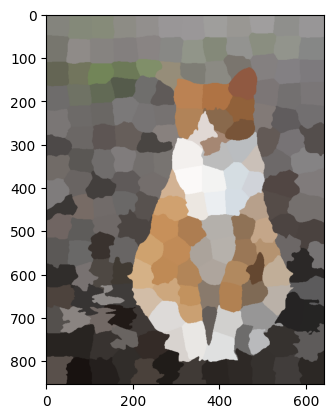

In [107]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from skimage.color import label2rgb


def calculate_superpixel_attributes_hsv(image, segments):
    # change color model to hsv
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    attributes = {}
    for segment_value in np.unique(segments):
        mask = segments == segment_value
        superpixel = hsv_image[mask]

        # Calculate attributes
        # channels in hsv is hue [0, 179], saturation [0, 255], value [0, 255]
        # we want to take max of saturation and value 

        sat_max = np.max(superpixel[:, 1])
        val_max = np.median(superpixel[:, 2])

        orange_range = [0,40]
        count_pixel_in_range = np.sum((orange_range[0] <= superpixel[:, 0]) & (superpixel[:, 0] <= orange_range[1]))
        orange_ratio = count_pixel_in_range / len(superpixel)


        attributes[segment_value] = {
            "sat_max": sat_max,
            "val_max": val_max,
            "orange_ratio": orange_ratio
        }

    return attributes


# Apply SLIC to segment the image into superpixels
segments = slic(tabby_rgb, n_segments=200, sigma=2, compactness=40)
print(segments)
plt.imshow(label2rgb(segments, tabby_rgb, kind="avg"))

# Calculate attributes for each superpixel
attributes = calculate_superpixel_attributes_hsv(tabby_rgb, segments)

In [271]:
import pandas as pd
import numpy as np

# Assuming attributes is already calculated as in your provided code
# Create a DataFrame from the attributes
# Extract the attribute names dynamically from the attributes dictionary
attribute_names = list(next(iter(attributes.values())).keys())

# Create a dictionary for the DataFrame
data_dict = {attr: [attributes[segment][attr] for segment in np.unique(segments)] for attr in attribute_names}

# Convert the dictionary to a DataFrame
df = pd.DataFrame(data_dict)


print(df.describe())
# transform to float

df = df.astype(np.float32)

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

data_normalized = scaler.fit_transform(df)

data_normalized = df.to_numpy()

print(data_normalized.shape)

          sat_max     val_max  orange_ratio
count  191.000000  191.000000    191.000000
mean   129.753927  129.539267      0.739005
std     75.446511   55.073107      0.220333
min     19.000000   14.000000      0.002573
25%     67.500000   95.000000      0.587036
50%    109.000000  124.000000      0.794894
75%    191.500000  160.500000      0.900066
max    255.000000  254.000000      1.000000
(191, 3)


In [272]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 2)
k = 9  # Number of clusters
_, labels, centers = cv2.kmeans(
    data_normalized, k, None, criteria, 200, cv2.KMEANS_PP_CENTERS
)


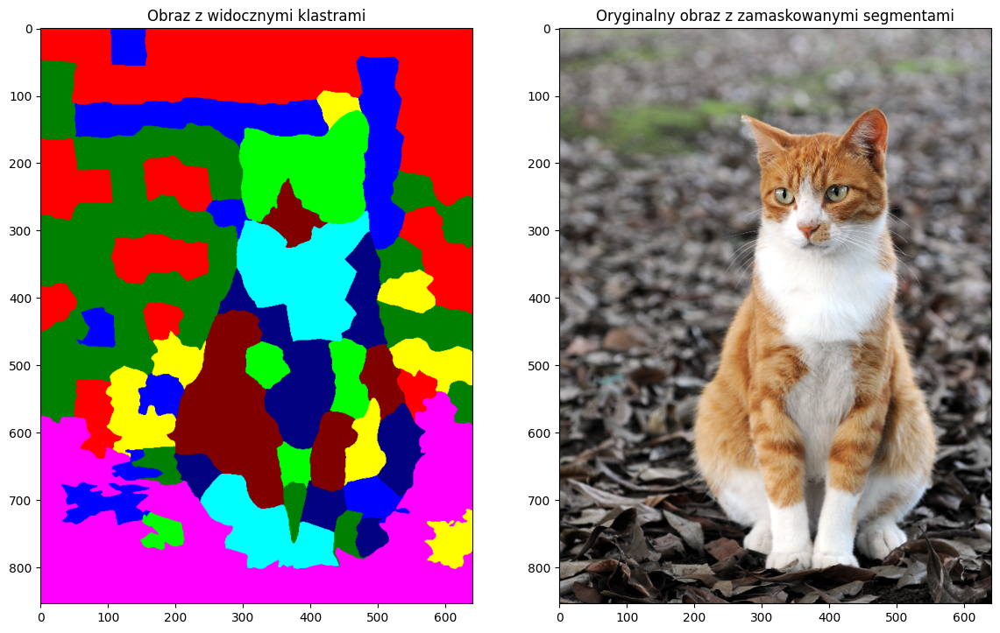

In [273]:
clusters_to_display = range(0,9,1)

# Flattening the labels array
labels = labels.flatten()

if len(np.unique(labels)) > len(cluster_colors):
    raise ValueError(
        "Nie zdefiniowano wystarczającej liczby kolorów dla wszystkich klastrów!"
    )

# Tworzenie obrazu z widocznymi klastrami
clustered_image = np.zeros(tabby_rgb.shape, dtype=np.uint8)

# Tworzenie maski, która wyłączy segmenty, których nie chcemy pokazywać
mask = np.zeros(tabby_rgb.shape[:2], dtype=bool)

# Iteracja po superpikselach i kolorowanie tylko wybranych klastrów
for i, segVal in enumerate(np.unique(segments)):
    cluster_label = labels[i]
    mask_segment = segments == segVal

    if cluster_label in clusters_to_display:
        clustered_image[mask_segment] = cluster_colors[cluster_label]
        mask[mask_segment] = True  # Ustawienie maski dla widocznych klastrów

# Tworzenie obrazu z zamaskowanymi pikselami
masked_image = np.copy(tabby_rgb)
masked_image[~mask] = 0  # Ustawienie zamaskowanych pikseli na czarne

# Wyświetlanie obrazów
fig, ax = plt.subplots(1, 2, figsize=(14, 10))

# Obraz z widocznymi klastrami
ax[0].imshow(clustered_image)
ax[0].set_title("Obraz z widocznymi klastrami")

# Oryginalny obraz z zamaskowanymi segmentami
ax[1].imshow(masked_image)
ax[1].set_title("Oryginalny obraz z zamaskowanymi segmentami")

plt.show()

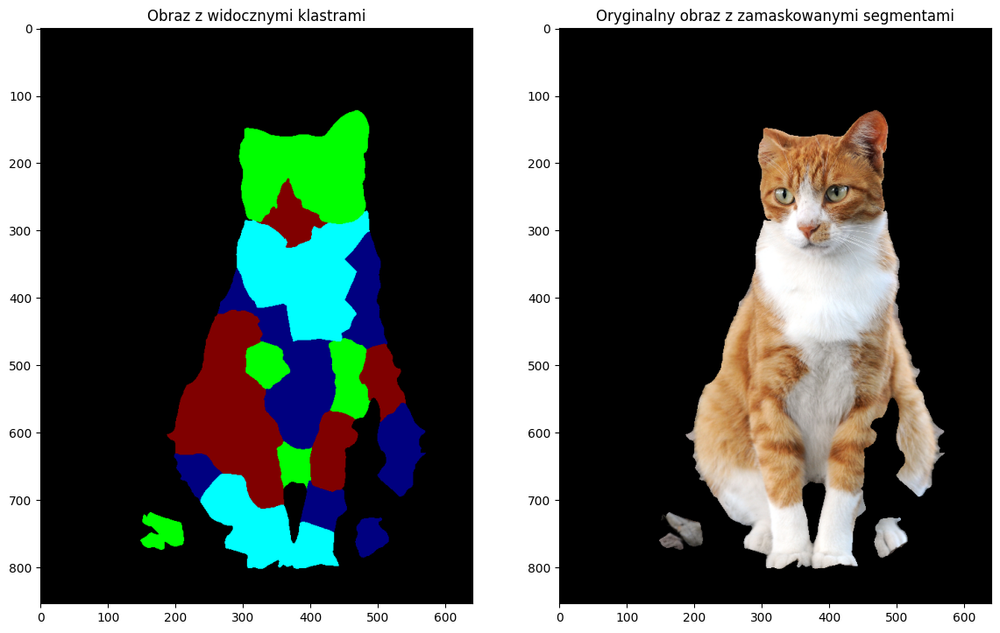

In [284]:
clusters_to_display = [1, 5, 6, 8]

# Flattening the labels array
labels = labels.flatten()

if len(np.unique(labels)) > len(cluster_colors):
    raise ValueError(
        "Nie zdefiniowano wystarczającej liczby kolorów dla wszystkich klastrów!"
    )

# Tworzenie obrazu z widocznymi klastrami
clustered_image = np.zeros(tabby_rgb.shape, dtype=np.uint8)

# Tworzenie maski, która wyłączy segmenty, których nie chcemy pokazywać
mask = np.zeros(tabby_rgb.shape[:2], dtype=bool)

# Iteracja po superpikselach i kolorowanie tylko wybranych klastrów
for i, segVal in enumerate(np.unique(segments)):
    cluster_label = labels[i]
    mask_segment = segments == segVal

    if cluster_label in clusters_to_display:
        clustered_image[mask_segment] = cluster_colors[cluster_label]
        mask[mask_segment] = True  # Ustawienie maski dla widocznych klastrów

# Tworzenie obrazu z zamaskowanymi pikselami
masked_image = np.copy(tabby_rgb)
masked_image[~mask] = 0  # Ustawienie zamaskowanych pikseli na czarne

# Wyświetlanie obrazów
fig, ax = plt.subplots(1, 2, figsize=(14, 10))

# Obraz z widocznymi klastrami
ax[0].imshow(clustered_image)
ax[0].set_title("Obraz z widocznymi klastrami")

# Oryginalny obraz z zamaskowanymi segmentami
ax[1].imshow(masked_image)
ax[1].set_title("Oryginalny obraz z zamaskowanymi segmentami")

plt.show()

[[ 1  1  1 ...  3  3  3]
 [ 1  1  1 ...  3  3  3]
 [ 1  1  1 ...  3  3  3]
 ...
 [14 14 14 ... 13 13 13]
 [14 14 14 ... 13 13 13]
 [14 14 14 ... 13 13 13]]


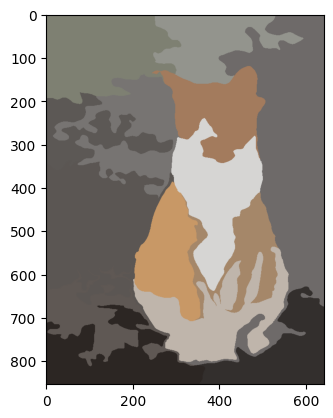

In [141]:
# Apply SLIC to segment the image into superpixels
segments = slic(tabby_rgb, n_segments=21, sigma=4)
print(segments)
plt.imshow(label2rgb(segments, tabby_rgb, kind="avg"))

# Calculate attributes for each superpixel
attributes = calculate_superpixel_attributes(tabby_rgb, segments)

In [142]:
data_dict = {
    "mean_color": [
        attributes[segment]["mean_color"] for segment in np.unique(segments)
    ],
    "min_color": [attributes[segment]["min_color"] for segment in np.unique(segments)],
    "max_color": [attributes[segment]["max_color"] for segment in np.unique(segments)],
    "median_color": [
        attributes[segment]["median_color"] for segment in np.unique(segments)
    ],
}

# Convert lists of color attributes to separate columns for each color channel
df = pd.DataFrame(data_dict)
df[["mean_color_r", "mean_color_g", "mean_color_b"]] = pd.DataFrame(
    df["mean_color"].tolist(), index=df.index
)
df[["min_color_r", "min_color_g", "min_color_b"]] = pd.DataFrame(
    df["min_color"].tolist(), index=df.index
)
df[["max_color_r", "max_color_g", "max_color_b"]] = pd.DataFrame(
    df["max_color"].tolist(), index=df.index
)
df[["median_color_r", "median_color_g", "median_color_b"]] = pd.DataFrame(
    df["median_color"].tolist(), index=df.index
)

# Drop the original combined color columns
df = df.drop(columns=["mean_color", "min_color", "max_color", "median_color"])
print(df.describe())
# transform to float

df = df.astype(np.float32)

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

data_normalized = scaler.fit_transform(df)

# data_normalized = df.to_numpy()

print(data_normalized.shape)

       mean_color_r  mean_color_g  mean_color_b  min_color_r  min_color_g  \
count     14.000000     14.000000     14.000000    14.000000    14.000000   
mean     129.720209    118.258579    106.865340    34.285714    26.857143   
std       53.186023     47.812131     45.644191    39.998901    31.324252   
min       44.383883     38.861401     35.700006     0.000000     0.000000   
25%       93.302883     88.331377     84.836058     0.000000     0.000000   
50%      122.945473    119.779924    103.871595    21.000000    19.000000   
75%      165.014512    145.021915    114.597961    60.000000    45.750000   
max      214.749969    213.154496    211.814398   116.000000    94.000000   

       min_color_b  max_color_r  max_color_g  max_color_b  median_color_r  \
count    14.000000    14.000000    14.000000    14.000000       14.000000   
mean     17.857143   224.571429   214.714286   213.928571      130.928571   
std      21.936472    28.532611    29.611403    31.984285       57.951524  

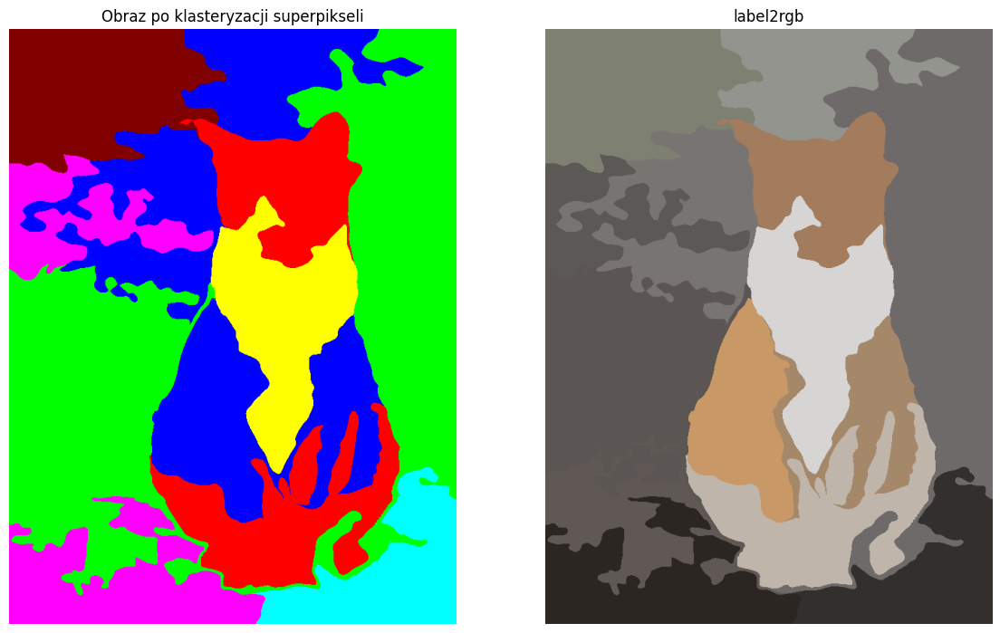

In [150]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.1)
k = 7  # Number of clusters
_, labels, centers = cv2.kmeans(
    data_normalized, k, None, criteria, 400, cv2.KMEANS_PP_CENTERS
)


# Create an empty image to store the color-coded segments
color_coded_image = np.zeros_like(tabby_rgb)

# Define colors for each cluster
cluster_colors = [
    (255, 0, 0),
    (0, 255, 0),
    (0, 0, 255),
    (255, 255, 0),
    (255, 0, 255),
    (0, 255, 255),
    (128, 0, 0),
    (0, 128, 0),
    (0, 0, 128),
    (128, 128, 0),
    (128, 0, 128),
    (0, 128, 128),
    (64, 0, 0),
    (0, 64, 0),
    (0, 0, 64),
    (64, 64, 0),
    (64, 0, 64),
    (0, 64, 64),
    (32, 0, 0),
    (0, 32, 0),
]  # Add more colors if you have more clusters

labels = labels.flatten()

# Sprawdzamy, czy liczba klastrów nie przekracza liczby dostępnych kolorów
if len(np.unique(labels)) > len(cluster_colors):
    raise ValueError(
        "Nie zdefiniowano wystarczającej liczby kolorów dla wszystkich klastrów!"
    )

# Przypisanie etykiet klastrów do segmentów superpikseli
clustered_image = np.zeros(tabby_rgb.shape, dtype=np.uint8)

# Iteracja po superpikselach i przypisanie koloru klastra do odpowiednich segmentów
for i, segVal in enumerate(np.unique(segments)):
    mask = segments == segVal
    clustered_image[mask] = cluster_colors[labels[i]]

# Wyświetlanie obrazu po klasteryzacji

fig, ax = plt.subplots(1, 2, figsize=(14, 10))

# Display the clustered image
ax[0].imshow(clustered_image)
ax[0].set_title("Obraz po klasteryzacji superpikseli")
ax[0].axis("off")

# Display the label2rgb image
ax[1].imshow(label2rgb(segments, tabby_rgb, kind="avg"))
ax[1].set_title("label2rgb")
ax[1].axis("off")

plt.show()

HSV mniej

[[ 1  1  1 ...  3  3  3]
 [ 1  1  1 ...  3  3  3]
 [ 1  1  1 ...  3  3  3]
 ...
 [14 14 14 ... 13 13 13]
 [14 14 14 ... 13 13 13]
 [14 14 14 ... 13 13 13]]


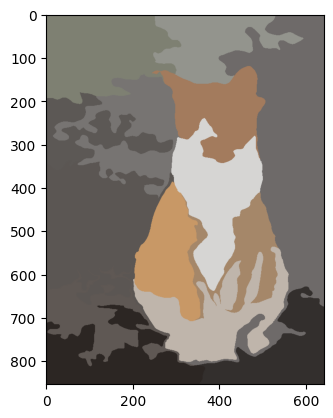

In [115]:
# Apply SLIC to segment the image into superpixels
segments = slic(tabby_rgb, n_segments=21, sigma=4)
print(segments)
plt.imshow(label2rgb(segments, tabby_rgb, kind="avg"))

# Calculate attributes for each superpixel
attributes = calculate_superpixel_attributes_hsv(tabby_rgb, segments)

In [116]:
import pandas as pd
import numpy as np

# Assuming attributes is already calculated as in your provided code
# Create a DataFrame from the attributes
# Extract the attribute names dynamically from the attributes dictionary
attribute_names = list(next(iter(attributes.values())).keys())

# Create a dictionary for the DataFrame
data_dict = {
    attr: [attributes[segment][attr] for segment in np.unique(segments)]
    for attr in attribute_names
}

# Convert the dictionary to a DataFrame
df = pd.DataFrame(data_dict)


print(df.describe())
# transform to float

df = df.astype(np.float32)

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

data_normalized = scaler.fit_transform(df)

data_normalized = df.to_numpy()

print(data_normalized.shape)

          sat_max     val_max  orange_ratio
count   14.000000   14.000000     14.000000
mean   198.428571  132.571429      0.774874
std     64.255158   59.340885      0.147065
min     95.000000   33.000000      0.509278
25%    132.750000   93.750000      0.658179
50%    220.000000  127.500000      0.785568
75%    255.000000  169.500000      0.877055
max    255.000000  226.000000      1.000000
(14, 3)


In [134]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.1)
k = 3  # Number of clusters
_, labels, centers = cv2.kmeans(
    data_normalized, k, None, criteria, 400, cv2.KMEANS_PP_CENTERS
)

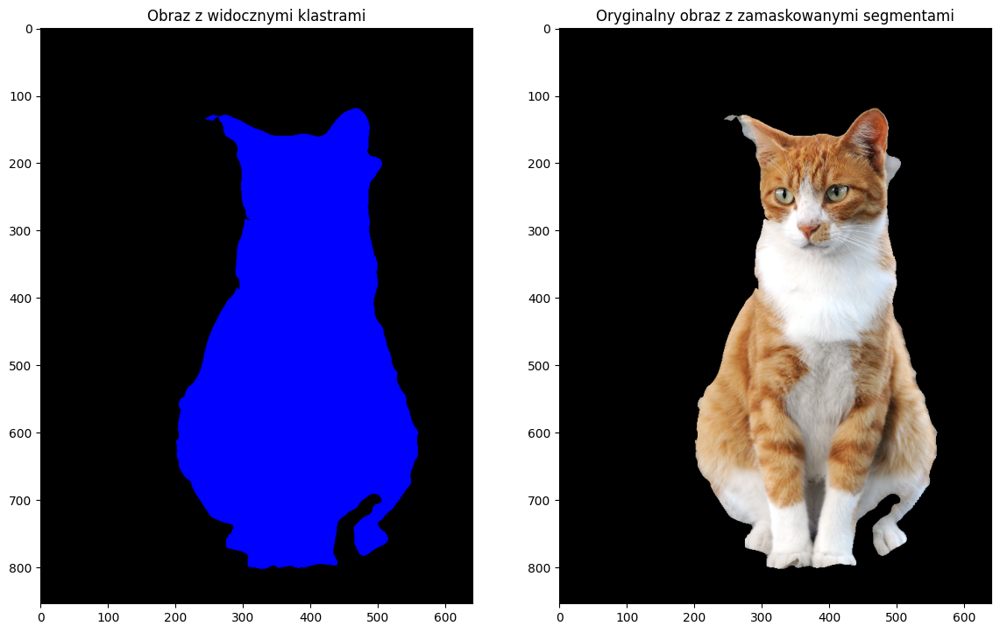

In [136]:
clusters_to_display = [2]

# Flattening the labels array
labels = labels.flatten()

if len(np.unique(labels)) > len(cluster_colors):
    raise ValueError(
        "Nie zdefiniowano wystarczającej liczby kolorów dla wszystkich klastrów!"
    )

# Tworzenie obrazu z widocznymi klastrami
clustered_image = np.zeros(tabby_rgb.shape, dtype=np.uint8)

# Tworzenie maski, która wyłączy segmenty, których nie chcemy pokazywać
mask = np.zeros(tabby_rgb.shape[:2], dtype=bool)

# Iteracja po superpikselach i kolorowanie tylko wybranych klastrów
for i, segVal in enumerate(np.unique(segments)):
    cluster_label = labels[i]
    mask_segment = segments == segVal

    if cluster_label in clusters_to_display:
        clustered_image[mask_segment] = cluster_colors[cluster_label]
        mask[mask_segment] = True  # Ustawienie maski dla widocznych klastrów

# Tworzenie obrazu z zamaskowanymi pikselami
masked_image = np.copy(tabby_rgb)
masked_image[~mask] = 0  # Ustawienie zamaskowanych pikseli na czarne

# Wyświetlanie obrazów
fig, ax = plt.subplots(1, 2, figsize=(14, 10))

# Obraz z widocznymi klastrami
ax[0].imshow(clustered_image)
ax[0].set_title("Obraz z widocznymi klastrami")

# Oryginalny obraz z zamaskowanymi segmentami
ax[1].imshow(masked_image)
ax[1].set_title("Oryginalny obraz z zamaskowanymi segmentami")

plt.show()